<a href="https://colab.research.google.com/github/AjaySreekumar47/Dog-Breed-Classifier/blob/main/dog_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## End-to-End Multi-class Dog Breed Classification

This notebook builds an end to end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem
Identifying the breed of a dog given an image of the dog.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:
* We are dealing with images (unstructured data) so, its probably best that we use Deep Learning / Transfer Learning.
* There are 120 breeds of dogs (meaning 120 different classes)
* There are around 10,000+ images in the training set (These images have labels)
* There are 10,000+ images in the test set. (No labels in these images as we need to predict them.)


In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/Dog Recognition/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Recognition/"

## Getting our Workspace Ready

* Import TensorFlow 2.x (If not the current version)
* Import TensorFlow Hub
* Make sure we are using a GPU

In [ ]:
# Import the necessary tools 
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version:", tf.__version__)
print("TF Hub Version:", hub.__version__)

# Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

TF Version: 2.8.0
TF Hub Version: 0.12.0
GPU available


## Getting our data ready (Turning into Tensors)

With all machine learning models, our data needs to be in numerical format. 

So, the first step is to turn the pictures into Tensors. (numerical representation)

In [ ]:
# Lets start by accessing our data and checking out the labels.
import pandas as pd
labels = pd.read_csv("/content/drive/MyDrive/Dog Recognition/labels.csv")
print(labels.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


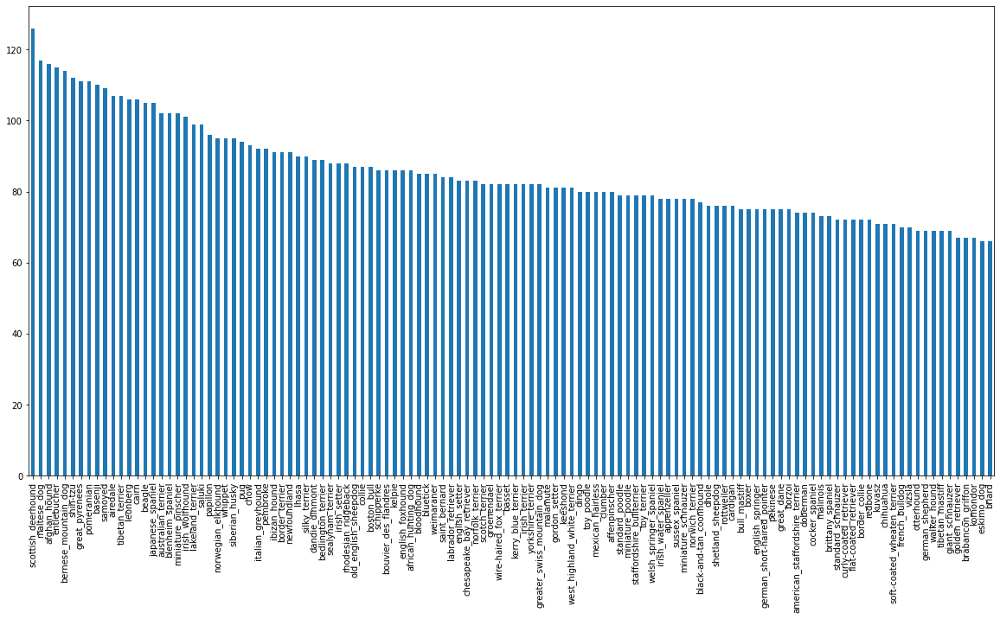

In [ ]:
labels["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels["breed"].value_counts().median()

82.0

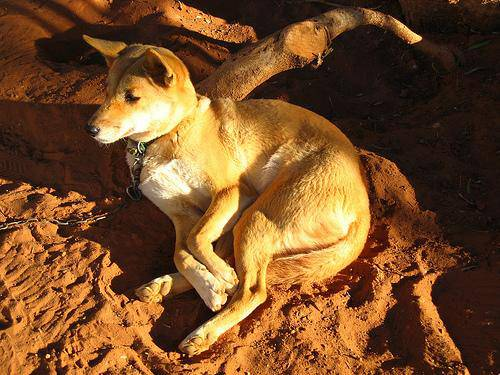

In [ ]:
# Lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Recognition/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting Images and their Labels

Lets get a list of all of our image pathnames.

In [ ]:
# Create pathnames from all image IDs
filenames = ["drive/MyDrive/Dog Recognition/train/"+ fname + ".jpg" for fname in labels["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Recognition/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Recognition/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Recognition/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Recognition/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Recognition/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Recognition/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Recognition/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Recognition/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Recognition/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Recognition/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether the number of filenames matches the actual number of image files
import os
if len(os.listdir("drive/MyDrive/Dog Recognition/train/")) == len(filenames):
  print("Filenames' numbers match.")
else:
  print("Different numbers uploaded and processed. Check again.")

Filenames' numbers match.


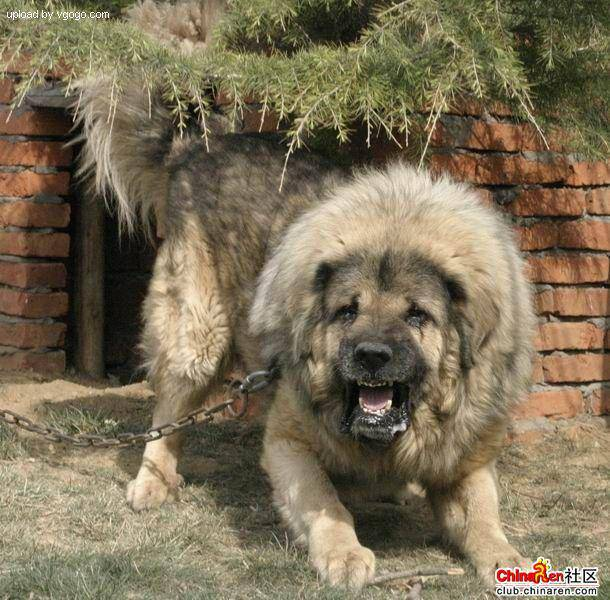

In [ ]:
Image(filenames[9000])

In [ ]:
labels["breed"][9000]

'tibetan_mastiff'

Since we have our filepaths in a list, we prepare our labels next.

In [ ]:
import numpy as np
breeds = labels["breed"].to_numpy()
breeds

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(breeds)

10222

In [ ]:
# See if number of breeds matches the number of filenames
if len(breeds) == len(filenames):
  print("Number of breeds matches number of filenames")
else:
  print("Numbers don't match. Check data directory")

Number of breeds matches number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(breeds)
len(unique_breeds)

120

In [ ]:
# Turn a single array into an array of booleans
print(breeds[0])
breeds[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean array
boolean_labels = [breed == unique_breeds for breed in breeds]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(breeds[0]) # Original Label
print(np.where(unique_breeds == breeds[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # There will be a 1 where sample label occurs 

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(breeds[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't have a separate validation set, we need to create our own set.

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

We start off experimenting with ~1000 images and increase as needed - since 10222 samples will take a long time for training.

In [ ]:
# Set number of images to use for experimenting
num_images = 1000  #@param {type:"slider",min:1000,max:10222,step:100}

In [ ]:
# Lets split our data into training and validation sets
from sklearn.model_selection import train_test_split

# split them into training and validation sets of total size num_images
X_train, X_val, y_train, y_val = train_test_split(X[:num_images],y[:num_images],test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:2]

['drive/MyDrive/Dog Recognition/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/Dog Recognition/train/0d2f9e12a2611d911d91a339074c8154.jpg']

In [ ]:
y_train[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Preprocessing Images (Turning Images into Tensors)`

To preprocess our images into Tensors, we are going to write a function which does the following:
* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable `image`.
* Turn our `image` (a jpg) into Tensors.
* Resize the `image` to be a shape of (224,224)
* Return the modified `image`.

Before we write the function, lets see what importing an image looks like.

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
image.max(),image.min()

(255, 0)

In [ ]:
# Turn image into Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we know what an image looks like as a Tensor, let us make the function as mentioned above.
* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable `image`.
* Turn our `image` (a jpg) into Tensors.
* Resize the `image` to be a shape of (224,224)
* Return the modified `image`.

In [ ]:
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
ts = tf.image.decode_jpeg(tensor,channels=3)
ts

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

In [ ]:
tf.image.convert_image_dtype(ts,tf.float32)

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

In [ ]:
# Define Image size
IMG_SIZE = 224

# Function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image path as input and turns the image into a Tensor.
  """
  # Read an image file as input
  image = tf.io.read_file(image_path)

  # Turn the jpg image into a numerical Tensor with 3 colour channels (Red,Green,Blue)
  image = tf.image.decode_jpeg(image,channels=3)

  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)

  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size = [IMG_SIZE,IMG_SIZE])

  return image

## Turning our data into batches

Trying to process 10000+ images in one go might not fit into memory. So, it is important for us to divide the data into batches so that there is a consistent learning rate for our model.

So, here we do about 32 (batch size) images at a time (you can manually adjust the batch size if need be)

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
(`image`,`label`)

In [ ]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  Takes an image file path and the associated label as input, processes the image and 
  returns a tuple of format (image,label)  
  """
  image = process_image(image_path)
  return image,label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have a way to turn our data into tuples of Tensors in the form: (`image`,`label`) - we next make a function to turn all of our data (`X` and `y`) into batches.

In [ ]:
# Define the batch size - 32 is a good baseline
BATCH_SIZE = 32

# Create a function to turn data into batches takes default input as False for validation and test datasets.
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label(y) pairs.
  Shuffles the data if its training data but doesn't shuffle if its validation data.
  Also accepts test data as input (no labels, hence y=None as default argument)
  """

  # If the data is a test dataset - we probably don't have labels.
  if test_data:
    print("Creating Test Batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths, no labels - creates a dataset from Tensor form of X
    data_batch = data.map(process_image).batch(BATCH_SIZE) # Basically equivalent to process_image(data) taken in batches of BS -> 32.
    return data_batch

  # If the data is a validation dataset - we dont need to shuffle it  
  elif valid_data:
    print("Creating Validation Batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y))) # Both filepaths and labels present as this is the validation dataset
    data_batch = data.map(get_image_label).batch(BATCH_SIZE) # Basically equivalent to process_image(data) taken in batches of BS -> 32.
    return data_batch

  else:
    print("Creating Training Batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y))) # Both filepaths and labels present as this is the training dataset
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    # Create (image,label) tuples. This also turns the image path into a preprocessed image.
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)

Creating Training Batches...
Creating Validation Batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches 

Our data is now in batches. However, these can be a little hard to understand or comprehend - so lets visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup this figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 Rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[9.96078491e-01, 9.96078491e-01, 9.01960850e-01],
          [9.96078491e-01, 9.96078491e-01, 9.01960850e-01],
          [9.96078491e-01, 9.96078491e-01, 9.01960850e-01],
          ...,
          [9.97041345e-01, 9.93119776e-01, 9.73511934e-01],
          [9.99404728e-01, 1.00000000e+00, 9.70763266e-01],
          [9.90651250e-01, 9.98494387e-01, 9.55357134e-01]],
 
         [[9.96078491e-01, 9.96078491e-01, 9.01960850e-01],
          [9.96078491e-01, 9.96078491e-01, 9.01960850e-01],
          [9.96078491e-01, 9.96078491e-01, 9.01960850e-01],
          ...,
          [9.84313786e-01, 9.80392218e-01, 9.60784376e-01],
          [9.99993384e-01, 1.00000000e+00, 9.72616673e-01],
          [9.93040264e-01, 9.96961772e-01, 9.65643167e-01]],
 
         [[9.96078491e-01, 9.96078491e-01, 9.01960850e-01],
          [9.96078491e-01, 9.96078491e-01, 9.01960850e-01],
          [9.96078491e-01, 9.96078491e-01, 9.01960850e-01],
          ...,
          [9.84313786e-01, 9.80392218e-01, 9.6078

In [ ]:
len(train_images), len(train_labels)

(32, 32)

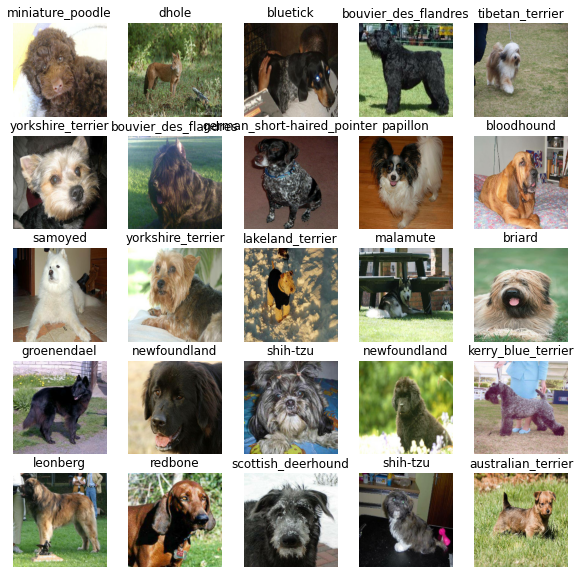

In [ ]:
# Lets visualize the data in a training batch
show_25_images(train_images, train_labels)

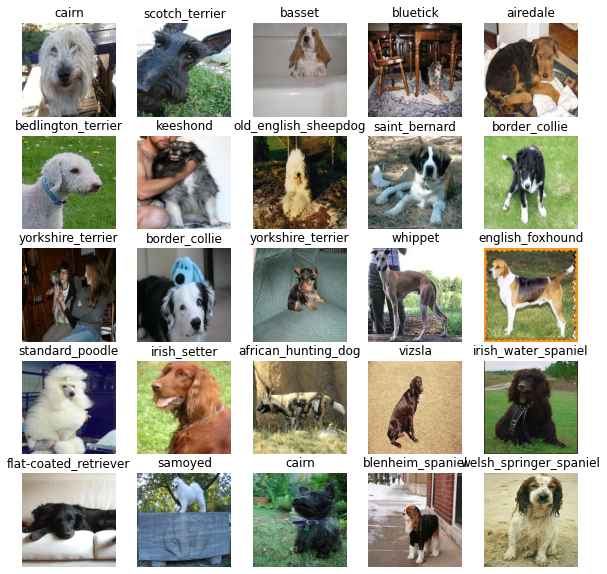

In [ ]:
# Now lets visualize the validation set
val_images, val_labels =  next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a Model

Before a model is built, there are a few things we need to define:

* The input shape (our images' shape in the form of Tensors) to our model.
* The output shape (image labels in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub. (https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/)

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3] # Batch, height, width, colour channels
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5" 

Now we have our Inputs, outputs and model ready-to-go, lets put them together in a Keras Deep Learning model.

We create a function which:
* Takes the input shape, output shape and the model we have chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then the next step)
* Compiles the model (says how it should be evaluated and improved)
* Builds the model (tells the model the input shape it will be getting)
* Returns the model.

In [ ]:
# Create a function that builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with",MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation="softmax") #Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if the model stops improving.

We create 2 callbacks: 
1. TensorBoard: helps track our model's progress 
2. Early Stopping Callback: Stopping our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (after training the model).

In [ ]:
# Load TensorBoard Notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard Callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Recognition/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  # Make the above expression so that the logs get tracked whenever we run an experiment
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

## Training a model (on a subset of data):

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

Epochs represent the number of iterations the model is allowed to use the training data in the fitting process. So, in this case - it can access the data 100 times.

In [ ]:
# Check to make sure we are still running on a GPU
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Creating a function that trains a model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it on the training data, validation data, number of epochs to train for ('NUM_EPOCHS') and the callbacks we'd like to use.
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained model.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data - passing it the callbacks we created
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 111s 4s/step - loss: 4.6020 - accuracy: 0.0988 - val_loss: 3.3680 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 5s 180ms/step - loss: 1.6360 - accuracy: 0.7013 - val_loss: 2.1331 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 5s 181ms/step - loss: 0.5627 - accuracy: 0.9400 - val_loss: 1.6428 - val_accuracy: 0.6200
Epoch 4/100
25/25 [==============================] - 5s 180ms/step - loss: 0.2468 - accuracy: 0.9875 - val_loss: 1.4487 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 5s 186ms/step - loss: 0.1471 - accuracy: 0.9962 - val_loss: 1.3760 - val_accuracy: 0.6900
Epoch 6/100
25/25 [==============================] - 5s 183ms/step - loss: 0.1001 - accuracy: 1.0000 - val_loss: 1.3316 - val_accuracy: 0.6900
Epoch 7/100
25/25 [==============================] 

We see that the model is clearly overfitting on the training data. This is a good thing, since it shows that it has learnt all the training data - and needs to be generalized on validation and test data incoming.

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Recognition/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data batch (since it wasn't used for training)
predictions = model.predict(val_data,verbose=1) #verbose=1 shows the progress of the predictions
predictions

7/7 [==============================] - 26s 156ms/step


array([[8.6818670e-04, 8.4972467e-05, 9.2531904e-04, ..., 1.6898746e-04,
        1.9297269e-05, 4.3955394e-03],
       [3.5378439e-04, 2.2398791e-04, 2.9656887e-03, ..., 4.3346859e-05,
        5.0209876e-04, 2.0335496e-05],
       [5.6667352e-05, 4.9999682e-04, 6.2865863e-04, ..., 3.6046523e-04,
        2.7653805e-04, 5.7755515e-04],
       ...,
       [5.7310244e-06, 4.1860450e-05, 2.2448185e-05, ..., 2.5039584e-05,
        2.6119043e-05, 4.8970407e-05],
       [9.0238573e-03, 2.2222726e-04, 9.4632764e-05, ..., 3.6633961e-04,
        5.5261269e-05, 1.6633140e-02],
       [1.3630938e-04, 2.3904238e-05, 1.8805590e-03, ..., 1.3881699e-02,
        7.4781819e-05, 1.0401862e-04]], dtype=float32)

In [ ]:
predictions.shape # Here, we get 200 elements, of 120 predictive numbers each.

(200, 120)

In [ ]:
len(y_val),len(unique_breeds)

(200, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First Prediction
index=0
print(predictions[index])
print(f"Max Value (Probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(predictions[index])]}")

[8.68186704e-04 8.49724674e-05 9.25319036e-04 4.62589560e-05
 3.10607633e-04 7.01515773e-06 3.04984357e-02 5.14177897e-04
 1.60298106e-04 7.72098021e-04 1.28418818e-04 5.44201001e-04
 3.01734923e-04 1.82279177e-06 1.06148096e-03 3.56036151e-04
 3.08881608e-05 4.27907467e-01 1.57847080e-05 2.71510908e-05
 4.44466219e-04 1.28217886e-04 1.50433125e-05 1.09119760e-03
 2.39062465e-05 3.48051835e-05 2.11340517e-01 2.40423658e-04
 2.06647033e-04 2.38148976e-04 4.96791399e-05 4.40049125e-03
 2.82183610e-04 1.31398947e-05 2.56299318e-05 1.22625632e-02
 8.84482233e-06 1.39138050e-04 1.01436912e-04 4.98741501e-05
 5.88979921e-04 1.15870323e-04 9.34090349e-05 5.83815672e-05
 1.43875814e-05 9.79287142e-05 6.88240907e-05 7.16694165e-04
 3.08758208e-05 2.66428560e-05 2.23991810e-04 2.57308584e-05
 6.50523070e-05 6.47936904e-05 2.17045454e-04 9.57342054e-05
 7.68822138e-05 5.91901189e-04 3.86378495e-04 1.22800678e-01
 1.22877100e-04 6.24105596e-05 1.16487965e-03 7.58012175e-05
 3.43053107e-04 1.470172

In [ ]:
# Second Prediction
index=42
print(predictions[index])
print(f"Max Value (Probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(predictions[index])]}")

[4.05699648e-05 1.10410554e-04 3.75183263e-05 5.85171656e-05
 1.84539403e-03 8.05506934e-05 1.58228853e-04 7.99975533e-04
 2.31614197e-03 7.70388031e-03 1.29783457e-05 2.03437121e-05
 1.19549659e-04 3.68458056e-03 3.60534061e-04 1.67213439e-03
 1.23143991e-05 2.08551763e-04 2.55334799e-05 6.14487435e-05
 3.51709537e-06 6.05174224e-04 3.89441921e-05 1.02579570e-05
 3.01948469e-03 5.99350824e-05 1.11927084e-05 6.34182070e-05
 3.96870855e-05 2.00679860e-05 7.34425703e-06 9.98678515e-05
 4.35885231e-05 1.20134982e-05 1.67246453e-05 1.59438150e-05
 1.88487647e-05 5.03728865e-04 4.33725727e-05 6.06198981e-02
 1.46461593e-04 3.77244141e-05 2.90627591e-03 2.75370949e-05
 8.73655954e-05 2.69449502e-05 1.51408225e-04 4.06921026e-04
 1.01374004e-04 4.86748577e-05 3.02603985e-05 5.99940904e-05
 2.24074596e-04 1.83596829e-04 4.03499507e-05 2.66727031e-04
 4.43292200e-04 2.18889018e-05 2.85001715e-05 2.33588198e-05
 2.64249484e-05 1.07862463e-04 1.12260659e-06 3.86122447e-05
 6.98666190e-05 1.222329

Having the above functionality is great, but we want to do it in scale. We require a visual medium to confirm the evaluations being made with the pictures.

**Note:** Prediction probabilities are also known as Confidence Levels.

In [ ]:
# Turn the prediction probabilities into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into labels.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]
  
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

Now, we want to unbatch the validation dataset, so that we can process all 200 images present as part of validation dataset and make predictions on them to evaluate the trained model upon comparison with the actual validation labels.

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch the dataset. Before we proceed, lets check out what steps are taken in the function
images_ = []
labels_ = []

for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# Now, check the actual label in validation data with the predicted one
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

In [ ]:
# As seen above, we create a function based on those steps.
def unbatchify(data):
  """
  Unbatches any dataset (of the form (image,label) Tensors) passed into parameter and appends all elements into a list of images and labels.
  """

  images_ = []
  labels_ = []
  
  for image,label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  
  return images_, labels_

#Unbatchify the validation dataset
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have ways to get prediction labels, validation labels and validation images. Lets make a function to visualize all of these.

We will create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Converts the prediction probabilities into a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image in a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
  """
  View the prediction, ground truth and image for a sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove X and Y ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)



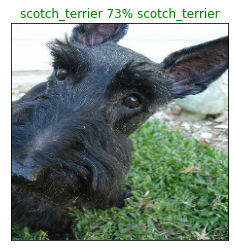

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images)

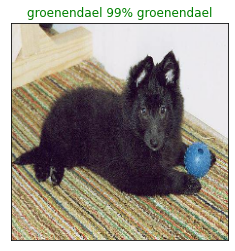

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images,n=77)

Now we have a function to visualize our model's top prediction, we can make another to view our model's top 10 predictions.

This function will:
* Take an input of prediction probabilities array, a ground truth array (labels) and an integer.
* Find the predictions using get_pred_label()
* Find the top 10:
  * Prediction probabilities values
  * Prediction probabilities indexes
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plot the top 10 highest prediction confidences along with the true label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] 

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  
  # Change the color of the true labels
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

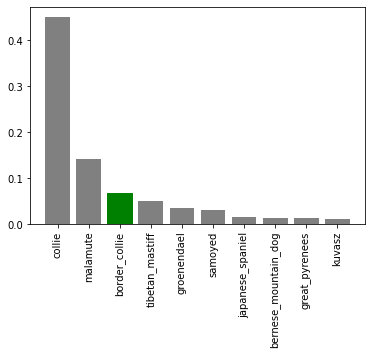

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 9)

Now that we can visualize our predictions and evaluate our model, lets check out a few.

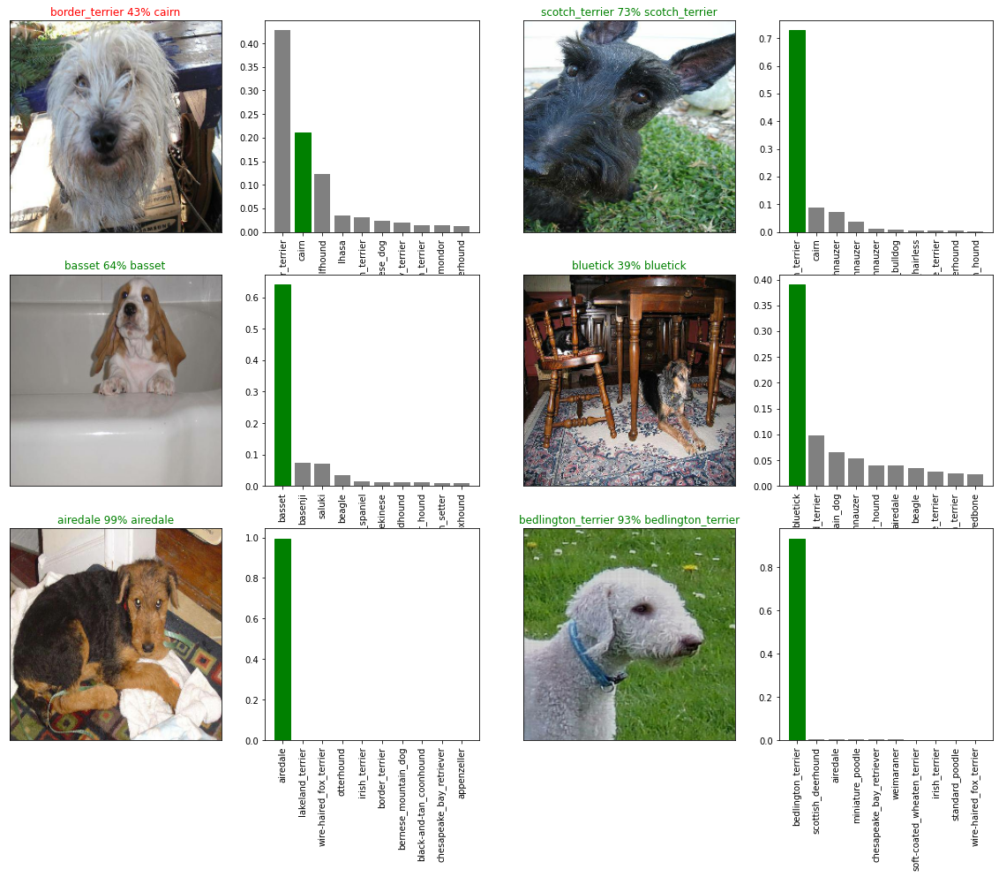

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i + i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i + i_multiplier)

plt.show()

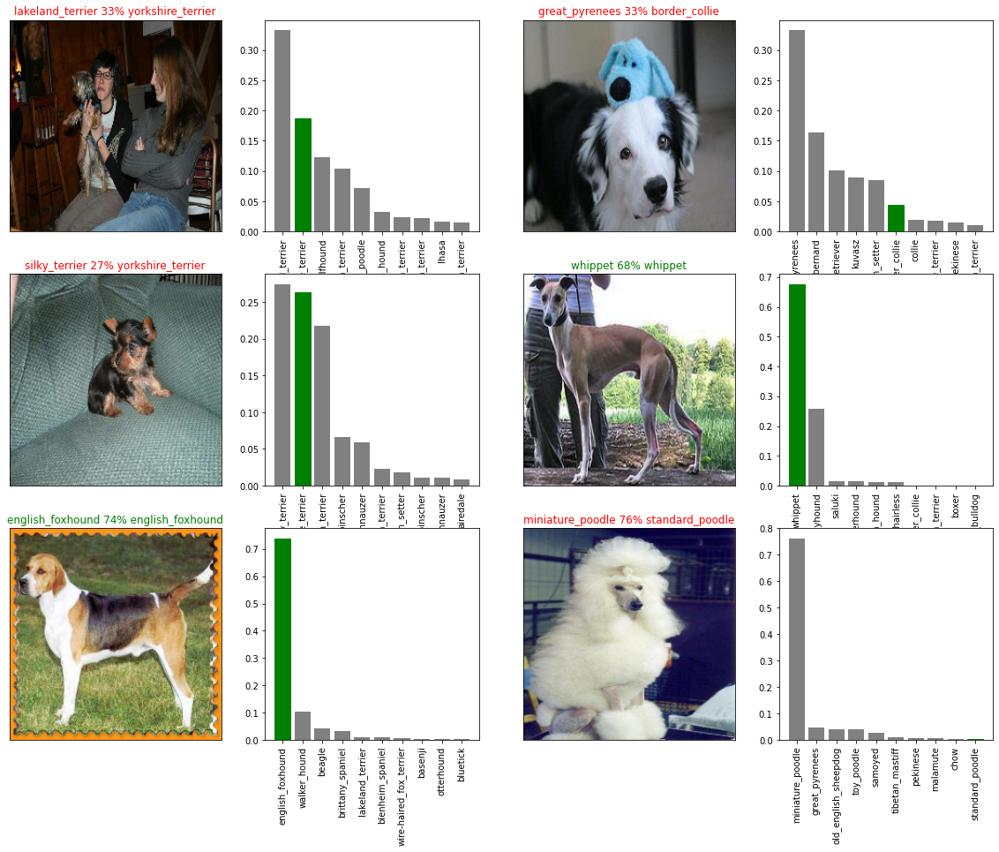

In [ ]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i + i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i + i_multiplier)

plt.show()

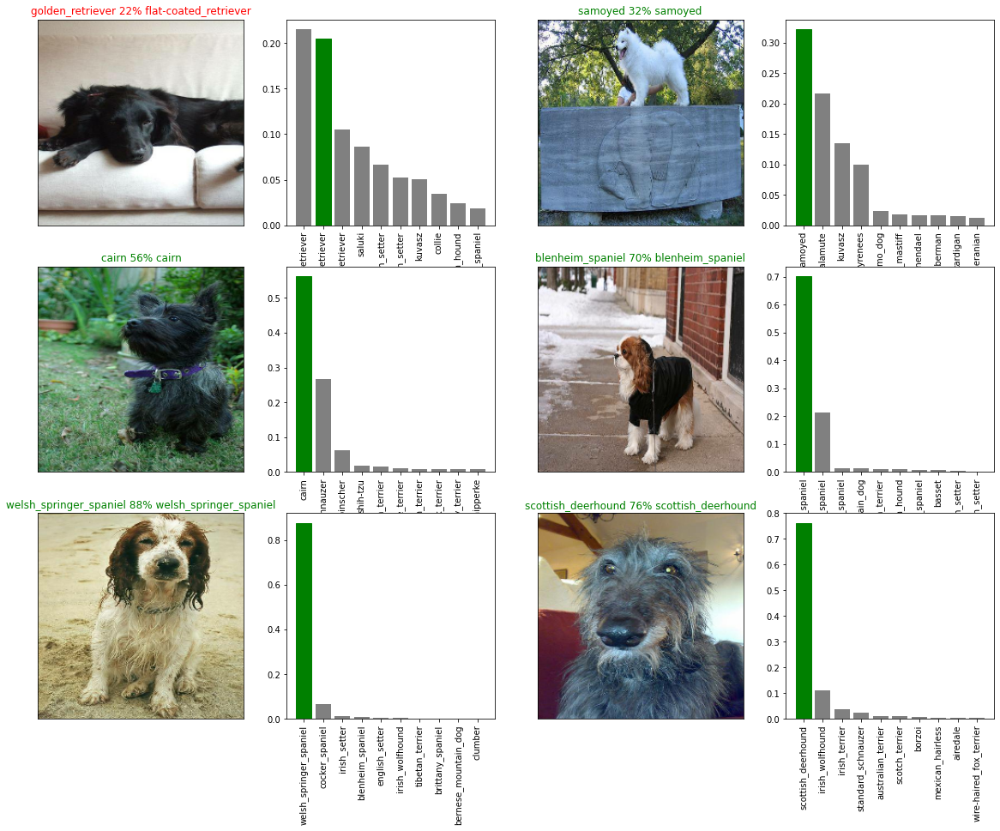

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i + i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i + i_multiplier)

plt.show()

## Saving and reloading our model

In [ ]:
# Create a function to save a model 
def save_model(model,suffix=None):
  """
  Saves a given model in a model directory, and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Recognition/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  modelpath = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to {modelpath}")
  model.save(modelpath) 

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading a model saved from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetV2-Adam")

Saving model to drive/MyDrive/Dog Recognition/Models/20220224-12451645706721-1000-images-mobilenetV2-Adam.h5


In [ ]:
# Load a trained Model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Recognition/Models/20220224-07041645686271-1000-images-mobilenetV2-Adam.h5")

Loading a model saved from: drive/MyDrive/Dog Recognition/Models/20220224-07041645686271-1000-images-mobilenetV2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 117ms/step - loss: 1.2188 - accuracy: 0.6950


[1.218772530555725, 0.6949999928474426]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data) 

7/7 [==============================] - 2s 118ms/step - loss: 1.2189 - accuracy: 0.6900


[1.2189098596572876, 0.6899999976158142]

## Training a big dog model (on the full dataset)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X,y)

Creating Training Batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full data
full_model = create_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set exists when we are training on all of the data. So, we cannot monitor validation accuracy.

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience = 3)

**Note:** Running the below cell will take a little while because the GPU we use in the runtime has to load ALL of the images into memory. Time taken may be upto 30 mins for the first epoch.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 65s 172ms/step - loss: 1.3383 - accuracy: 0.6730
Epoch 2/100
320/320 [==============================] - 52s 163ms/step - loss: 0.4011 - accuracy: 0.8810
Epoch 3/100
320/320 [==============================] - 49s 154ms/step - loss: 0.2384 - accuracy: 0.9332
Epoch 4/100
320/320 [==============================] - 52s 161ms/step - loss: 0.1541 - accuracy: 0.9621
Epoch 5/100
320/320 [==============================] - 53s 165ms/step - loss: 0.1077 - accuracy: 0.9775
Epoch 6/100
320/320 [==============================] - 53s 166ms/step - loss: 0.0770 - accuracy: 0.9862
Epoch 7/100
320/320 [==============================] - 53s 166ms/step - loss: 0.0599 - accuracy: 0.9900
Epoch 8/100
320/320 [==============================] - 55s 171ms/step - loss: 0.0475 - accuracy: 0.9936
Epoch 9/100
320/320 [==============================] - 53s 165ms/step - loss: 0.0375 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 55s 171m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetV2-Adam")

Saving model to drive/MyDrive/Dog Recognition/Models/20220224-08151645690557-full-image-set-mobilenetV2-Adam.h5


In [ ]:
loaded_full_model = load_model("drive/MyDrive/Dog Recognition/Models/20220224-08151645690557-full-image-set-mobilenetV2-Adam.h5")

Loading a model saved from: drive/MyDrive/Dog Recognition/Models/20220224-08151645690557-full-image-set-mobilenetV2-Adam.h5


## Make predictions on the test dataset

Since our model has been trained on images of the form of Tensor batches, we need to get our test data into the same format.

We have already create a function `create_data_batches()` which takes in a list of filenames as input and converts them into Tensor batches.

To make predictions on the test data, we need to:
* Get the test images filenames.
* Convert the filenames into test data batches using the above function. Set the `test_data` parameter to `True`. (since the test data does not have labels)
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test images filenames
test_path = "drive/MyDrive/Dog Recognition/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Recognition/test/e39be68f3200f0ecde589e571ae6df06.jpg',
 'drive/MyDrive/Dog Recognition/test/e07106e5301fbce05cade5c94f775a72.jpg',
 'drive/MyDrive/Dog Recognition/test/dd39ff72939c0445a76f0e7db9985f56.jpg',
 'drive/MyDrive/Dog Recognition/test/e0e47873420b2ed420e920a74c663233.jpg',
 'drive/MyDrive/Dog Recognition/test/de172eece3080506aa3bcf1967f4a90b.jpg',
 'drive/MyDrive/Dog Recognition/test/e2166bdff9e35f80aa7984ec64c8cce8.jpg',
 'drive/MyDrive/Dog Recognition/test/e64b15ca154304104fe95ded7338858e.jpg',
 'drive/MyDrive/Dog Recognition/test/e19900119c7d3ce48d4035cd0211be72.jpg',
 'drive/MyDrive/Dog Recognition/test/dd9d222a481e6cbea922a1b601a55a38.jpg',
 'drive/MyDrive/Dog Recognition/test/e3cec8d0c1876ac36942d35f64b9dfa0.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating Test Batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing our test data will take a long period of time. (~1 hour)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 183s 556ms/step


In [ ]:
# In case of timeouts or disconnections, we can save predictions (NumPy array) to csv file (for access later)
#np.savetxt("drive/MyDrive/Dog Recognition/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (if above method is used)
#test_predictions = np.loadtxt("drive/MyDrive/Dog Recognition/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[2.8980105e-07, 2.3784935e-10, 1.3826912e-08, ..., 2.2596990e-11,
        2.3388121e-07, 7.7630633e-05],
       [3.3971106e-09, 1.8598830e-06, 6.1976879e-10, ..., 3.5724602e-07,
        9.9445820e-01, 1.4747056e-07],
       [1.9452455e-10, 8.3292574e-13, 7.6058257e-12, ..., 1.5147216e-14,
        1.4719241e-09, 3.3721406e-06],
       ...,
       [1.2672398e-12, 6.3961223e-12, 4.7588552e-12, ..., 1.3388444e-09,
        5.0572914e-11, 6.7979316e-12],
       [8.5723535e-09, 7.2994361e-08, 3.8324774e-07, ..., 1.9974846e-09,
        1.8786871e-07, 9.0102441e-09],
       [1.5384816e-10, 1.9184151e-13, 3.4745357e-10, ..., 1.7974883e-09,
        1.8870502e-08, 1.3589766e-11]], dtype=float32)

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test data submissions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our model's prediction probabilities in a Dataframe with an ID and a column for each dog breed.

To get the data in this format we need to:
* Create a pandas dataframe with columns 'Id', as well as a column for each dog breed.
* Add data to the ID column by extracting the test image Id's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the dataframe as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas dataframe
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image Ids to predictions dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:10]

['e39be68f3200f0ecde589e571ae6df06',
 'e07106e5301fbce05cade5c94f775a72',
 'dd39ff72939c0445a76f0e7db9985f56',
 'e0e47873420b2ed420e920a74c663233',
 'de172eece3080506aa3bcf1967f4a90b',
 'e2166bdff9e35f80aa7984ec64c8cce8',
 'e64b15ca154304104fe95ded7338858e',
 'e19900119c7d3ce48d4035cd0211be72',
 'dd9d222a481e6cbea922a1b601a55a38',
 'e3cec8d0c1876ac36942d35f64b9dfa0']

In [ ]:
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e39be68f3200f0ecde589e571ae6df06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e07106e5301fbce05cade5c94f775a72,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dd39ff72939c0445a76f0e7db9985f56,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e0e47873420b2ed420e920a74c663233,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,de172eece3080506aa3bcf1967f4a90b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e39be68f3200f0ecde589e571ae6df06,2.898011e-07,2.378494e-10,1.382691e-08,8.614362e-12,2.632948e-10,2.610160e-08,1.060904e-09,1.172651e-09,3.390878e-11,5.968016e-09,1.364221e-10,7.644865e-09,9.311749e-09,3.075573e-08,1.591660e-11,9.011392e-09,2.565935e-09,1.157608e-10,3.926457e-10,3.202477e-09,8.204864e-11,1.925617e-09,3.225485e-08,4.136503e-09,1.679911e-09,9.314759e-11,3.727786e-09,1.957747e-09,6.648073e-12,2.291873e-04,1.803514e-11,3.987111e-10,5.472369e-10,4.574373e-08,3.868206e-12,1.364160e-13,8.941448e-10,2.130957e-11,1.612663e-10,...,2.284396e-11,4.819827e-09,2.489406e-12,7.309342e-11,9.996321e-01,2.612263e-07,1.117487e-08,3.175864e-06,7.087904e-11,3.214781e-11,4.720874e-12,4.008406e-11,5.160279e-09,1.327544e-09,3.072945e-09,5.369519e-08,2.498541e-11,4.940788e-11,9.454681e-11,2.515039e-07,1.584185e-07,3.616403e-09,4.566190e-07,1.832660e-11,1.272947e-08,9.367884e-12,1.417776e-10,8.655764e-09,7.449014e-11,6.981738e-09,7.275863e-07,1.087526e-06,1.653740e-10,4.496334e-10,3.962510e-10,8.968639e-10,1.294146e-07,2.259699e-11,2.338812e-07,7.763063e-05
1,e07106e5301fbce05cade5c94f775a72,3.397111e-09,1.859883e-06,6.197688e-10,3.354240e-05,1.638439e-09,2.046551e-09,6.945935e-08,9.367106e-08,8.167313e-12,9.326645e-10,4.658289e-06,1.090645e-09,3.131537e-08,2.694743e-08,2.166640e-10,3.158843e-09,1.863819e-08,2.085356e-09,5.864883e-06,1.418828e-08,4.068470e-09,4.069754e-11,3.655791e-09,7.335051e-09,2.693432e-09,7.421914e-08,3.044082e-09,1.072866e-08,3.823634e-10,2.297526e-09,1.153867e-08,4.697525e-08,1.924954e-08,1.257947e-05,2.162967e-08,7.750599e-08,8.992194e-11,3.918601e-08,2.079469e-06,...,7.005633e-09,9.889579e-08,1.445511e-06,3.894724e-04,1.596993e-09,2.832816e-09,1.322795e-09,4.349230e-10,1.589654e-09,3.919195e-10,1.016972e-07,3.195985e-10,4.205166e-09,4.266413e-09,1.196249e-10,2.287155e-09,4.196480e-09,3.082052e-06,3.787446e-05,3.591926e-09,4.557811e-08,1.449634e-09,7.403471e-10,1.256595e-08,1.269895e-06,9.047255e-09,1.406399e-03,4.182815e-09,3.319056e-09,1.133305e-08,7.205290e-07,4.673202e-07,1.281829e-08,5.011962e-06,9.050490e-11,2.765036e-07,9.508307e-07,3.572460e-07,9.944582e-01,1.474706e-07
2,dd39ff72939c0445a76f0e7db9985f56,1.945245e-10,8.329257e-13,7.605826e-12,3.731047e-13,1.315095e-09,9.909315e-12,2.258047e-11,7.853748e-11,3.791296e-11,1.622844e-10,4.023279e-14,4.962765e-10,2.025987e-13,5.048097e-09,2.328868e-15,3.607744e-11,1.319976e-08,2.240121e-14,4.806525e-11,1.688021e-12,7.354442e-13,2.150097e-13,3.258852e-11,1.868520e-10,7.111780e-07,1.503877e-14,1.595902e-11,4.658809e-09,2.075615e-13,2.549022e-05,7.142028e-12,9.452284e-09,1.143990e-09,3.517725e-10,3.931038e-15,1.073093e-14,1.611010e-11,3.259715e-12,1.041895e-12,...,1.550829e-13,1.324625e-11,3.630215e-13,6.697666e-12,9.999689e-01,7.116080e-09,7.227426e-09,3.207081e-07,8.439895e-12,8.696382e-13,2.524386e-15,3.238091e-14,4.968595e-12,1.339450e-11,4.495853e-07,1.015961e-10,1.151

In [ ]:
preds_df.to_csv("drive/MyDrive/Dog Recognition/full_model_predictions_submission1_mobilenetV2.csv",index=False)

## Making predictions on Custom Images

To make predictions on custom images, we need:
* The filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images wont have labels, we set the `test_data` parameter to True.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.


In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Recognition/Custom-Dog-Photos/"
custom_image_paths = [custom_path+fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Recognition/Custom-Dog-Photos/image.jpg',
 'drive/MyDrive/Dog Recognition/Custom-Dog-Photos/322868_1100-800x825.jpg',
 'drive/MyDrive/Dog Recognition/Custom-Dog-Photos/download.jpg']

In [ ]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating Test Batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

array([[1.08867459e-09, 1.48186163e-09, 3.19454629e-10, 2.15270987e-07,
        4.94745450e-07, 7.49325991e-05, 2.28579347e-06, 4.84710263e-08,
        7.08452524e-12, 4.32872266e-10, 1.69634006e-07, 2.66689145e-12,
        6.60077785e-06, 5.90449174e-12, 1.18445240e-10, 1.49749657e-10,
        6.50615256e-11, 1.69332631e-10, 1.13869481e-09, 1.72492454e-09,
        2.63489768e-11, 1.16032288e-10, 2.08850572e-08, 4.51153941e-11,
        4.06253937e-12, 1.49957293e-12, 9.37715530e-11, 1.78955548e-11,
        1.51478951e-11, 5.35034106e-09, 1.37266526e-11, 1.03509964e-10,
        7.93806080e-12, 1.03719762e-08, 8.76755668e-10, 1.04102109e-11,
        1.14855488e-12, 8.29464586e-09, 8.77375305e-01, 1.53722868e-09,
        6.08238571e-09, 1.94042976e-11, 7.02777420e-11, 4.94754626e-10,
        1.70371259e-10, 2.56044547e-10, 1.18227552e-08, 1.43919265e-09,
        3.34367430e-11, 2.34098274e-09, 1.41317187e-07, 1.04428617e-08,
        3.54791396e-08, 1.54992392e-07, 3.63439745e-09, 8.214401

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['doberman', 'brittany_spaniel', 'miniature_pinscher']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't any labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

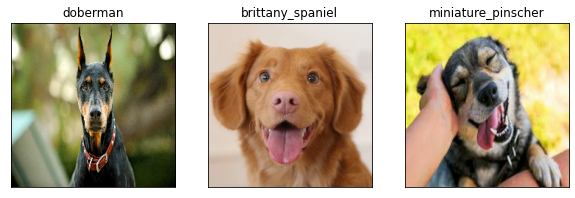

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)